# Plotting Nonlinearity results

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
# importing the libraries

%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import xarray as xr
import netCDF4
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [6]:
from scipy import stats

In [7]:
import seaborn as sns

In [8]:
mpl.rcParams['font.family'] = 'Droid Sans'
mpl.rcParams['font.size'] = 12
# Edit axes parameters
mpl.rcParams['axes.linewidth'] = 1.5
# Tick properties
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.minor.size'] = 3
mpl.rcParams['xtick.major.width'] = 1
mpl.rcParams['xtick.direction'] = 'out'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.minor.size'] = 3
mpl.rcParams['ytick.major.width'] = 1
mpl.rcParams['ytick.direction'] = 'out'

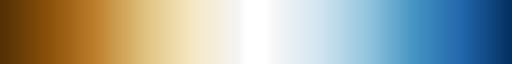

In [9]:
n = 35
diff = 0.5
cmap = plt.cm.BrBG
cmap2 = plt.cm.RdBu
lower = cmap(np.linspace(0, diff, n))
white = np.ones((2, 4))
upper = cmap2(np.linspace(1-diff, 1, n))
colors = np.vstack((lower, white, white, upper))
BrBU = mpl.colors.LinearSegmentedColormap.from_list('map_white', colors)
BrBU

In [10]:
out = xr.open_dataset('./PhD/enso_precip_asymmetry/data/result/out_final.nc')
out

<xarray.Dataset>
Dimensions:      (model: 32, region: 46, season: 5)
Coordinates:
  * model        (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
  * region       (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables:
    std_dev      (model, region, season) float64 ...
    clim         (model, region, season) float64 ...
    corr_coef    (model, region, season) float64 ...
    pval         (model, region, season) float64 ...
    nino         (model, region, season) float64 ...
    nina         (model, region, season) float64 ...
    neut         (model, region, season) float64 ...
    en_events    (model, season) float64 ...
    ln_events    (model, season) float64 ...
    neut_events  (model, season) float64 ...
    threshold    (model) float64 ...

<Axes: xlabel='threshold', ylabel='model'>

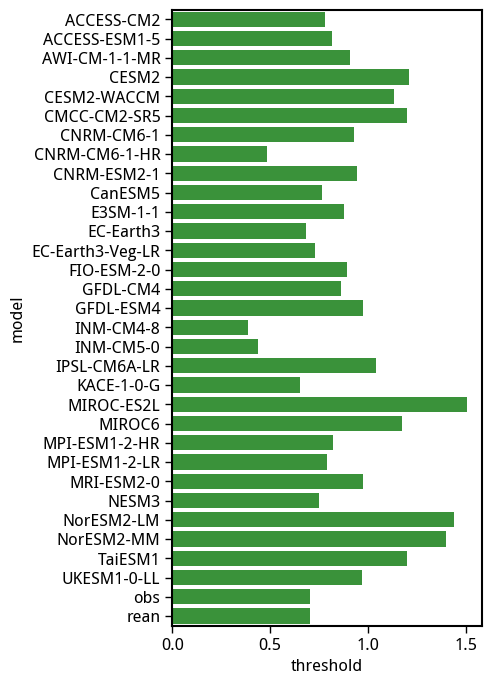

In [17]:
plt.figure(figsize=(4,8))
sns.barplot(out.threshold.to_dataframe(), x='threshold', y=out.threshold.to_dataframe().index, color='tab:green')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 [Text(0, 0, 'ACCESS-CM2'),
  Text(1, 0, 'ACCESS-ESM1-5'),
  Text(2, 0, 'AWI-CM-1-1-MR'),
  Text(3, 0, 'CESM2'),
  Text(4, 0, 'CESM2-WACCM'),
  Text(5, 0, 'CMCC-CM2-SR5'),
  Text(6, 0, 'CNRM-CM6-1'),
  Text(7, 0, 'CNRM-CM6-1-HR'),
  Text(8, 0, 'CNRM-ESM2-1'),
  Text(9, 0, 'CanESM5'),
  Text(10, 0, 'E3SM-1-1'),
  Text(11, 0, 'EC-Earth3'),
  Text(12, 0, 'EC-Earth3-Veg-LR'),
  Text(13, 0, 'FIO-ESM-2-0'),
  Text(14, 0, 'GFDL-CM4'),
  Text(15, 0, 'GFDL-ESM4'),
  Text(16, 0, 'INM-CM4-8'),
  Text(17, 0, 'INM-CM5-0'),
  Text(18, 0, 'IPSL-CM6A-LR'),
  Text(19, 0, 'KACE-1-0-G'),
  Text(20, 0, 'MIROC-ES2L'),
  Text(21, 0, 'MIROC6'),
  Text(22, 0, 'MPI-ESM1-2-HR'),
  Text(23, 0, 'MPI-ESM1-2-LR'),
  Text(24, 0, 'MRI-ESM2-0'),
  Text(25, 0, 'NESM3'),
  Text(26, 0, 'NorESM2-LM'),
  Text(27, 0, 'NorESM2-MM'),
  Text(28, 0, 'TaiESM1'),
  Text(29, 0, 'UKESM1-0

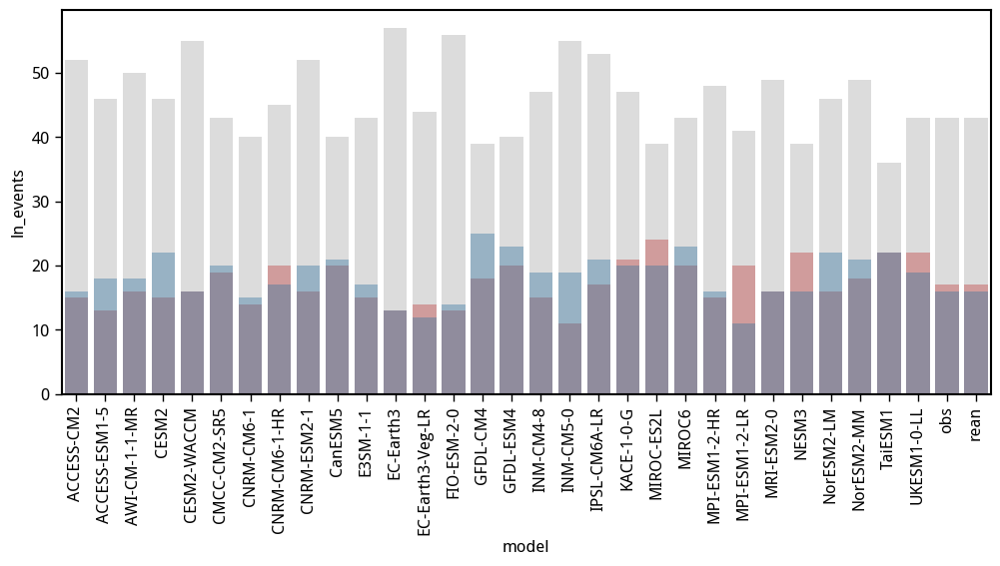

In [34]:
plt.figure(figsize=(12,5))
df = out.isel(season=4, region=0).to_dataframe()
sns.barplot(df, x=df.index, y = 'neut_events', color='darkgray', alpha=0.4)
sns.barplot(df, x=df.index, y = 'en_events', color='tab:red', alpha=0.4)
sns.barplot(df, x=df.index, y = 'ln_events', color='tab:blue', alpha=0.4)
plt.xticks(rotation=90)

In [35]:
# plotting code
import matplotlib as m
from matplotlib.colors import BoundaryNorm as BM


def plot_background(ax):
    ax.add_feature(cfeature.COASTLINE, alpha=0.9, lw=1.1)
    ax.set_global()
    # ax.add_feature(cfeature.LAND, color='lightgray')
    # ax.add_feature(cfeature.OCEAN, color='lightgray')
    gl = ax.gridlines(draw_labels=True,
                      linewidth=1, color='gray', alpha=0.01, linestyle='--')
    gl.top_labels = False
    # gl.left_labels = False
    # gl.bottom_labels = False
    gl.right_labels = False
    gl.xlines = False
    # gl.xlocator = mticker.FixedLocator([-180, -45, 0, 45, 180])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabel_style = {'size': 10, 'color': 'k'}
    gl.ylabel_style = {'size': 10, 'color': 'k'}
    return ax

def plot(z, titles, cmap, vmin, vmax, cbar_label = 'Precip', pval = [], pval_mme=[], nrows=1, ncols=3, figsize=(12,4), ocean_mask_list = []):
    cmap.set_bad('white',1.)
    pg = regionmask.defined_regions.ar6.land.polygons
    fig, axarr = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, constrained_layout=True, subplot_kw={'projection':ccrs.Robinson(central_longitude=0)})
    
    axlist = axarr.flatten()
    
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(z)):
        min_val, max_val = min(z[i]), max(z[i])
        # colors = cmap(plt.Normalize(min_val, max_val)(z[i]))
        colors = cmap(plt.Normalize(vmin, vmax)(z[i]))
        
        for j in range(len(z[i])):
            if pval != [] and pval_mme == []:
                if pval[i][j] > 0.05:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            elif pval == [] and pval_mme != []:
                if pval_mme[i][j] < 0.51:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='/////')
                else:
                    axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
            else:
                axlist[i].add_geometries(pg[j], crs=ccrs.PlateCarree(), facecolor=list(colors)[j], edgecolor='k', alpha=1.0, hatch='')
        axlist[i].set_title(titles[i])
        if i in ocean_mask_list:
            axlist[i].add_feature(cfeature.OCEAN, color = 'white', zorder=1)
            
    for ax in axlist:
        plot_background(ax)
        
    plt.colorbar(m.cm.ScalarMappable(norm = norm, cmap=cmap), ax = axlist, \
                orientation = 'vertical', shrink=0.7, aspect = 20, pad = 0.01, label = cbar_label)

In [36]:
import seaborn as sns

In [37]:
import regionmask

In [38]:
region_names = regionmask.defined_regions.ar6.land.to_dataframe()['names'].to_numpy()
region_names

array(['Greenland/Iceland', 'N.W.North-America', 'N.E.North-America',
       'W.North-America', 'C.North-America', 'E.North-America',
       'N.Central-America', 'S.Central-America', 'Caribbean',
       'N.W.South-America', 'N.South-America', 'N.E.South-America',
       'South-American-Monsoon', 'S.W.South-America', 'S.E.South-America',
       'S.South-America', 'N.Europe', 'West&Central-Europe', 'E.Europe',
       'Mediterranean', 'Sahara', 'Western-Africa', 'Central-Africa',
       'N.Eastern-Africa', 'S.Eastern-Africa', 'W.Southern-Africa',
       'E.Southern-Africa', 'Madagascar', 'Russian-Arctic', 'W.Siberia',
       'E.Siberia', 'Russian-Far-East', 'W.C.Asia', 'E.C.Asia',
       'Tibetan-Plateau', 'E.Asia', 'Arabian-Peninsula', 'S.Asia',
       'S.E.Asia', 'N.Australia', 'C.Australia', 'E.Australia',
       'S.Australia', 'New-Zealand', 'E.Antarctica', 'W.Antarctica'],
      dtype=object)

In [39]:
save_loc = './PhD/enso_precip_asymmetry/images/regional/'

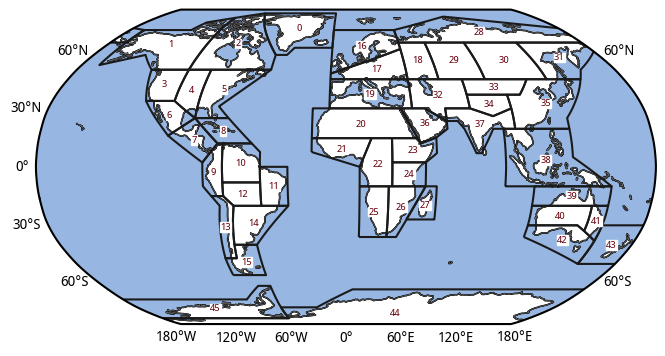

In [40]:
fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection = ccrs.Robinson())
ax.coastlines()
plot_background(ax)
text_kws = dict(color="#67000d", fontsize=7, bbox=dict(pad=0.2, color="w"))
regionmask.defined_regions.ar6.land.plot(text_kws=text_kws, add_ocean=True)
plt.savefig(save_loc+'regions.png', dpi=300, bbox_inches='tight')

#### clim

In [41]:
clim_list = [out.isel(season = 0, model = -2).clim,
             out.isel(season = 1, model = -2).clim,
             out.isel(season = 2, model = -2).clim,
             out.isel(season = 3, model = -2).clim,
             out.isel(season = 4, model = -2).clim]

In [42]:
title_list = ['ANN CLIM', 'DJF CLIM', 'MAM CLIM', 'JJA CLIM', 'SON CLIM']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

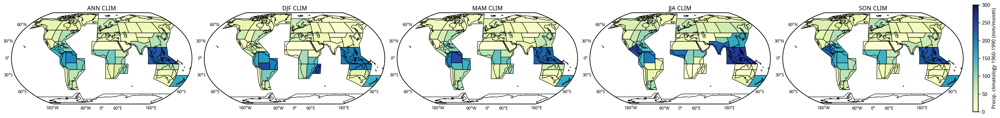

In [43]:
plot(clim_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=300, cbar_label = 'Precip. climatology 1960-1990 (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'/obs_clim.png', dpi=300, bbox_inches='tight')

#### std

In [44]:
std_list = [out.isel(season = 0, model = -2).std_dev,
             out.isel(season = 1, model = -2).std_dev,
             out.isel(season = 2, model = -2).std_dev,
             out.isel(season = 3, model = -2).std_dev,
             out.isel(season = 4, model = -2).std_dev]

In [45]:
title_list = ['ANN STD', 'DJF STD', 'MAM STD', 'JJA STD', 'SON STD']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

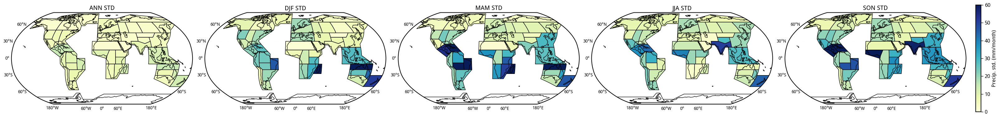

In [46]:
plot(std_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=60, cbar_label = 'Precip. std. (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc + '/obs_std.png', dpi=300, bbox_inches='tight')

#### corr

In [47]:
corr_list = [out.isel(season = 0, model = -2).corr_coef,
             out.isel(season = 1, model = -2).corr_coef,
             out.isel(season = 2, model = -2).corr_coef,
             out.isel(season = 3, model = -2).corr_coef,
             out.isel(season = 4, model = -2).corr_coef]

In [48]:
pval_list = [out.isel(season = 0, model = -2).pval, 
             out.isel(season = 1, model = -2).pval,
             out.isel(season = 2, model = -2).pval,
             out.isel(season = 3, model = -2).pval,
             out.isel(season = 4, model = -2).pval]

In [49]:
title_list = ['ANN CORR', 'DJF CORR', 'MAM CORR', 'JJA CORR', 'SON CORR']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

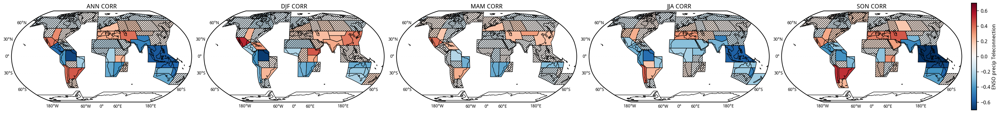

In [50]:
plot(corr_list, title_list, mpl.cm.RdBu_r, vmin=-0.7, vmax=0.7, cbar_label = 'ENSO precip Teleconnection', pval = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'rean_corr.png', dpi=300, bbox_inches='tight')

#### nino state

In [51]:
plot_list = [out.isel(season = 0, model = -2).nino, 
             out.isel(season = 1, model = -2).nino,
             out.isel(season = 2, model = -2).nino,
             out.isel(season = 3, model = -2).nino,
             out.isel(season = 4, model = -2).nino,
             out.isel(season = 0, model = -2).nina,
             out.isel(season = 1, model = -2).nina,
             out.isel(season = 2, model = -2).nina,
             out.isel(season = 3, model = -2).nina,
             out.isel(season = 4, model = -2).nina,
             out.isel(season = 0, model = -2).neut,
             out.isel(season = 1, model = -2).neut,
             out.isel(season = 2, model = -2).neut,
             out.isel(season = 3, model = -2).neut,
             out.isel(season = 4, model = -2).neut]

In [52]:
pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(), 
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy()]

In [53]:
title_list = ['ANN NINO', 'DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'ANN NINA', 'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'ANN NEUT', 'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

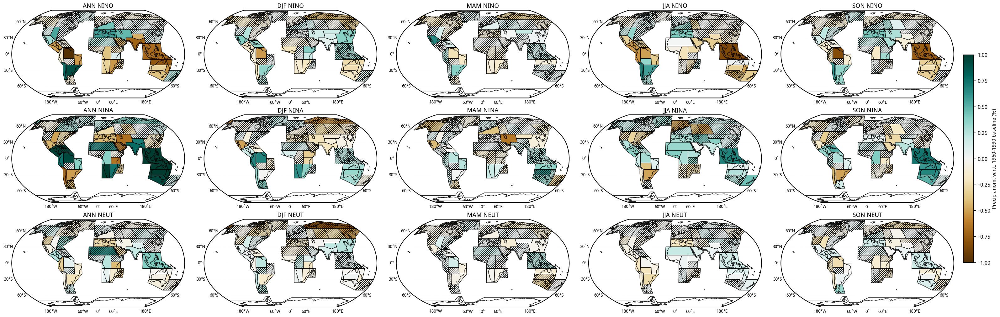

In [54]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1, vmax=1, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval = pval_list, \
     nrows=3, ncols=5, figsize=(32,10), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/obs_enso_state.png', dpi=300, bbox_inches='tight')

#### nino change

In [55]:
out['enc'] = out.nino - out.neut
out['lnc'] = out.nina - out.neut
out['asymm'] = (out.enc + out.lnc)/2
out['symm'] = (out.enc - out.lnc)/2

In [56]:
plot_list = [out.isel(season = 0, model = -2).enc, 
             out.isel(season = 1, model = -2).enc,
             out.isel(season = 2, model = -2).enc,
             out.isel(season = 3, model = -2).enc,
             out.isel(season = 4, model = -2).enc,
             out.isel(season = 0, model = -2).lnc,
             out.isel(season = 1, model = -2).lnc,
             out.isel(season = 2, model = -2).lnc,
             out.isel(season = 3, model = -2).lnc,
             out.isel(season = 4, model = -2).lnc]

In [57]:
pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(), 
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy()]

In [58]:
title_list = ['ANN ENC', 'DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'ANN LNC', 'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

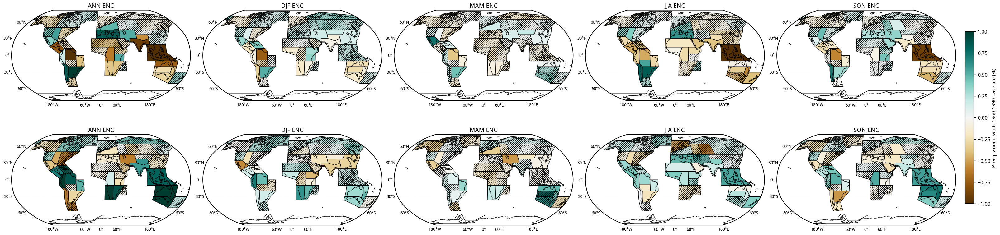

In [59]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1, vmax=1, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'/obs_enso_change.png', dpi=300, bbox_inches='tight')

#### asymm and symm

In [60]:
plot_list = [out.isel(season = 0, model = -2).asymm, 
             out.isel(season = 1, model = -2).asymm,
             out.isel(season = 2, model = -2).asymm,
             out.isel(season = 3, model = -2).asymm,
             out.isel(season = 4, model = -2).asymm,
             out.isel(season = 0, model = -2).symm,
             out.isel(season = 1, model = -2).symm,
             out.isel(season = 2, model = -2).symm,
             out.isel(season = 3, model = -2).symm,
             out.isel(season = 4, model = -2).symm]

In [61]:
pval_list = [out.isel(season = 0, model = -2).pval.to_numpy(), 
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy(),
             out.isel(season = 0, model = -2).pval.to_numpy(),
             out.isel(season = 1, model = -2).pval.to_numpy(),
             out.isel(season = 2, model = -2).pval.to_numpy(),
             out.isel(season = 3, model = -2).pval.to_numpy(),
             out.isel(season = 4, model = -2).pval.to_numpy()]

In [62]:
title_list = ['ANN ASYMM', 'DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM',
              'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

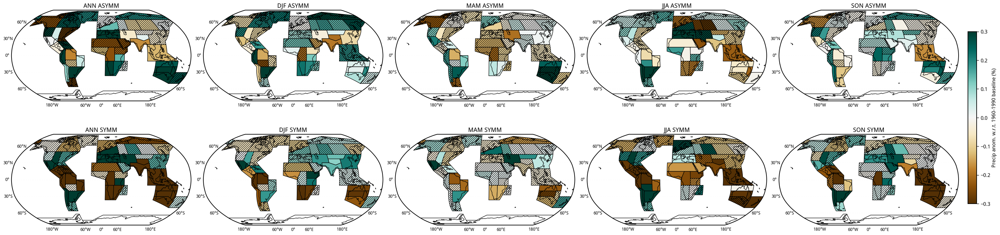

In [63]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-0.3, vmax=0.3, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'obs_asymm_symm.png', dpi=300, bbox_inches='tight')

#### Other plots

In [64]:
import os
model_list = sorted(os.listdir('/scratch/ob22/as8561/data/preproc//'))[1:]

In [65]:
model_list

['ACCESS-CM2',
 'ACCESS-ESM1-5',
 'AWI-CM-1-1-MR',
 'CESM2',
 'CESM2-WACCM',
 'CMCC-CM2-SR5',
 'CNRM-CM6-1',
 'CNRM-CM6-1-HR',
 'CNRM-ESM2-1',
 'CanESM5',
 'E3SM-1-1',
 'EC-Earth3',
 'EC-Earth3-Veg-LR',
 'FIO-ESM-2-0',
 'GFDL-CM4',
 'GFDL-ESM4',
 'INM-CM4-8',
 'INM-CM5-0',
 'IPSL-CM6A-LR',
 'KACE-1-0-G',
 'MIROC-ES2L',
 'MIROC6',
 'MPI-ESM1-2-HR',
 'MPI-ESM1-2-LR',
 'MRI-ESM2-0',
 'NESM3',
 'NorESM2-LM',
 'NorESM2-MM',
 'TaiESM1',
 'UKESM1-0-LL',
 'obs',
 'rean']

In [66]:
model_colors = ['tab:red', 'red', 'tab:brown', 'tab:blue', 'blue', 'tab:green', 'darkgreen', 'limegreen', \
                'lightgreen', 'teal', 'darkviolet', 'violet', 'purple', 'deeppink', 'tab:orange', 'yellow', \
                'gold', 'lightsalmon', 'sandybrown', 'goldenrod', 'maroon', 'darkred', 'skyblue', 'steelblue', \
                'indigo', 'pink', 'hotpink', 'navy', 'midnightblue', 'darkslateblue', 'k', 'tab:blue']

In [67]:
len(model_colors)

32

In [68]:
region_names[-7]

'N.Australia'

In [69]:
ea = out.isel(region=-5)
ea

<xarray.Dataset>
Dimensions:      (model: 32, season: 5)
Coordinates:
  * model        (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
    region       <U11 'E.Australia'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/15)
    std_dev      (model, season) float64 ...
    clim         (model, season) float64 ...
    corr_coef    (model, season) float64 ...
    pval         (model, season) float64 ...
    nino         (model, season) float64 ...
    nina         (model, season) float64 ...
    ...           ...
    neut_events  (model, season) float64 ...
    threshold    (model) float64 0.7793 0.8189 0.9073 ... 0.9691 0.7032 0.7032
    enc          (model, season) float64 -0.1612 -0.1753 ... -0.4108 -0.07249
    lnc          (model, season) float64 1.304 0.5591 0.5348 ... 0.07606 0.514
    asymm        (model, season) float64 0.5712 0.1919 0.2736 ... -0.1674 0.2208
    symm         (model, season) float64 -0.7324 -0.3672 ... -0.2435 -0.2932

In [70]:
str(ea.model[0].values)

'ACCESS-CM2'

In [71]:
ea.isel(season = 3, model = -2).std_dev.values

array(23.08540151)

In [72]:
def plot_scatter(da, var):
    for j in range(len(da.model)):
        if da.model[j] == 'obs' or da.model[j] == 'rean':
            (da.isel(model = j)[var]).drop(['model', 'region']).plot.scatter(color = model_colors[j], marker = 'D', alpha = 0.9, s = 80, facecolor='white', label = model_list[j])
        else:
            (da.isel(model = j)[var]).drop(['model', 'region']).plot.scatter(color = model_colors[j], marker = 'o', alpha = 0.4, s = 10, facecolor='white', label = model_list[j])
    (da.isel(model = slice(0, -2))[var]).mean('model').drop(['region']).plot.scatter(color = 'tab:red', marker='D', alpha = 0.9, s = 80, facecolor='white', label = 'mme')

In [73]:
ea

<xarray.Dataset>
Dimensions:      (model: 32, season: 5)
Coordinates:
  * model        (model) object 'ACCESS-CM2' 'ACCESS-ESM1-5' ... 'obs' 'rean'
    region       <U11 'E.Australia'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/15)
    std_dev      (model, season) float64 ...
    clim         (model, season) float64 ...
    corr_coef    (model, season) float64 ...
    pval         (model, season) float64 ...
    nino         (model, season) float64 ...
    nina         (model, season) float64 ...
    ...           ...
    neut_events  (model, season) float64 ...
    threshold    (model) float64 0.7793 0.8189 0.9073 ... 0.9691 0.7032 0.7032
    enc          (model, season) float64 -0.1612 -0.1753 ... -0.4108 -0.07249
    lnc          (model, season) float64 1.304 0.5591 0.5348 ... 0.07606 0.514
    asymm        (model, season) float64 0.5712 0.1919 0.2736 ... -0.1674 0.2208
    symm         (model, season) float64 -0.7324 -0.3672 ... -0.2435 -0.2932

(-1.5, 1.5)

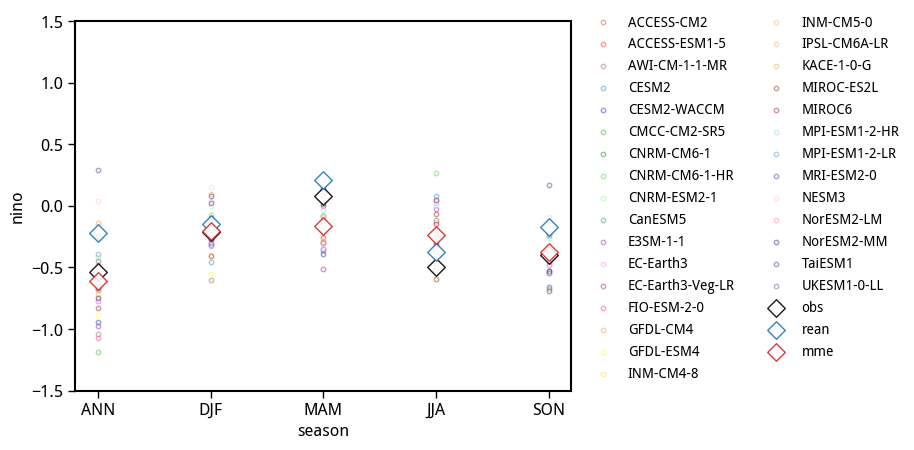

In [74]:
plot_scatter(ea, 'nino')
plt.legend(frameon=False, ncol=2,  fontsize = 10, bbox_to_anchor = [1.01, 1.05])
plt.ylim(-1.5, 1.5)
# plt.savefig('./PhD/prelim_tasks/images/regional/naus_asymm_scatter.png', dpi=300, bbox_inches='tight')

(-1.5, 1.5)

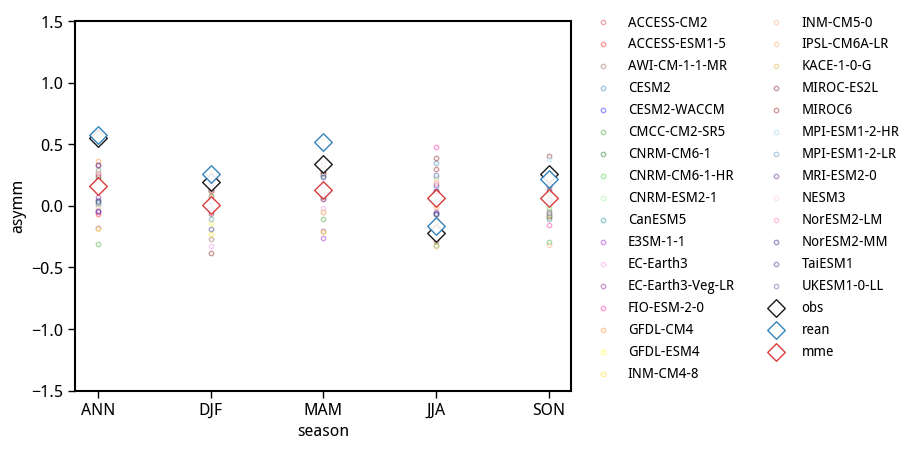

In [75]:
plot_scatter(ea, 'asymm')
plt.legend(frameon=False, ncol=2,  fontsize = 10, bbox_to_anchor = [1.01, 1.05])
plt.ylim(-1.5, 1.5)
# plt.savefig('./PhD/prelim_tasks/images/regional/naus_asymm_scatter.png', dpi=300, bbox_inches='tight')

### creating mme dataset

In [76]:
def get_sig1d(x):
    sig_models = len(x[x < 0.05])
    return float(sig_models/32)


def get_sign3d(da, dim):
    return xr.apply_ufunc(get_sig1d, da, input_core_dims=[[dim]], vectorize=True, dask='parallelized')

In [77]:
mme_ds = out.drop(['pval']).mean('model')

In [78]:
mme_ds['sign_ratio'] = get_sign3d(out.pval, dim='model')

In [79]:
mme_ds

<xarray.Dataset>
Dimensions:      (region: 46, season: 5)
Coordinates:
  * region       (region) object 'Greenland/Iceland' ... 'W.Antarctica'
  * season       (season) object 'ANN' 'DJF' 'MAM' 'JJA' 'SON'
Data variables: (12/15)
    std_dev      (region, season) float64 3.363 9.024 8.095 ... 10.4 10.01 9.985
    clim         (region, season) float64 33.59 29.19 27.32 ... 39.71 35.03
    corr_coef    (region, season) float64 0.03297 0.05175 ... 0.04199 0.01309
    nino         (region, season) float64 0.1437 0.08868 ... 0.06161 0.0424
    nina         (region, season) float64 0.08607 -0.01996 ... -0.02719 0.00298
    neut         (region, season) float64 0.1189 0.07317 ... 0.000333 0.008394
    ...           ...
    threshold    float64 0.9113
    enc          (region, season) float64 0.02483 0.01551 ... 0.06128 0.034
    lnc          (region, season) float64 -0.03284 -0.09314 ... -0.005415
    asymm        (region, season) float64 -0.004007 -0.03881 ... 0.01688 0.01429
    symm         (region, season) float64 0.02884 0.05432 ... 0.0444 0.01971
    sign_ratio   (region, season) float64 0.09375 0.2188 0.2188 ... 0.125 0.1562

#### clim

In [80]:
clim_list = [mme_ds.isel(season = 0).clim,
             mme_ds.isel(season = 1).clim,
             mme_ds.isel(season = 2).clim,
             mme_ds.isel(season = 3).clim,
             mme_ds.isel(season = 4).clim]

In [81]:
title_list = ['ANN CLIM', 'DJF CLIM', 'MAM CLIM', 'JJA CLIM', 'SON CLIM']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

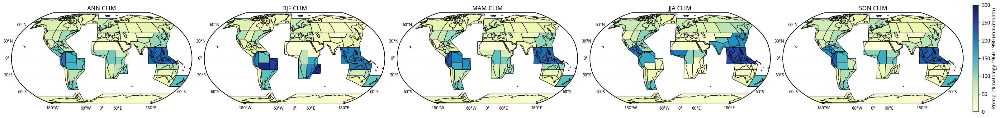

In [82]:
plot(clim_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=300, cbar_label = 'Precip. climatology 1960-1990 (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'/mme_clim.png', dpi=300, bbox_inches='tight')

#### std

In [83]:
std_list = [mme_ds.isel(season = 0).std_dev,
            mme_ds.isel(season = 1).std_dev,
            mme_ds.isel(season = 2).std_dev,
            mme_ds.isel(season = 3).std_dev,
            mme_ds.isel(season = 4).std_dev]

In [84]:
title_list = ['ANN STD', 'DJF STD', 'MAM STD', 'JJA STD', 'SON STD']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

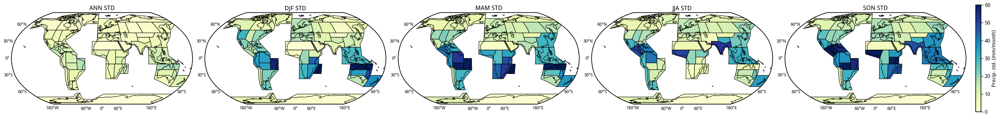

In [85]:
plot(std_list, title_list, mpl.cm.YlGnBu, vmin=0, vmax=60, cbar_label = 'Precip. std. (mm/month)', pval = [], \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc + '/mme_std.png', dpi=300, bbox_inches='tight')

#### corr

In [86]:
corr_list = [mme_ds.isel(season = 0).corr_coef,
             mme_ds.isel(season = 1).corr_coef,
             mme_ds.isel(season = 2).corr_coef,
             mme_ds.isel(season = 3).corr_coef,
             mme_ds.isel(season = 4).corr_coef]

In [87]:
pval_list = [mme_ds.isel(season = 0).sign_ratio, 
             mme_ds.isel(season = 1).sign_ratio,
             mme_ds.isel(season = 2).sign_ratio,
             mme_ds.isel(season = 3).sign_ratio,
             mme_ds.isel(season = 4).sign_ratio]

In [88]:
title_list = ['ANN CORR', 'DJF CORR', 'MAM CORR', 'JJA CORR', 'SON CORR']
              # 'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

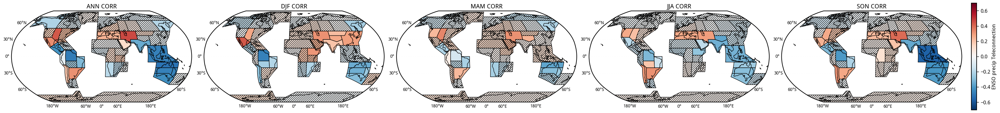

In [89]:
plot(corr_list, title_list, mpl.cm.RdBu_r, vmin=-0.7, vmax=0.7, cbar_label = 'ENSO precip Teleconnection', pval_mme = pval_list, \
     nrows=1, ncols=5, figsize=(32,5), ocean_mask_list = np.arange(0, 5, 1))
plt.savefig(save_loc+'mme_corr.png', dpi=300, bbox_inches='tight')

#### nino state

In [90]:
plot_list = [mme_ds.isel(season = 0).nino, 
             mme_ds.isel(season = 1).nino,
             mme_ds.isel(season = 2).nino,
             mme_ds.isel(season = 3).nino,
             mme_ds.isel(season = 4).nino,
             mme_ds.isel(season = 0).nina,
             mme_ds.isel(season = 1).nina,
             mme_ds.isel(season = 2).nina,
             mme_ds.isel(season = 3).nina,
             mme_ds.isel(season = 4).nina,
             mme_ds.isel(season = 0).neut,
             mme_ds.isel(season = 1).neut,
             mme_ds.isel(season = 2).neut,
             mme_ds.isel(season = 3).neut,
             mme_ds.isel(season = 4).neut]

In [91]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [92]:
title_list = ['ANN NINO', 'DJF NINO', 'MAM NINO', 'JJA NINO', 'SON NINO',
              'ANN NINA', 'DJF NINA', 'MAM NINA', 'JJA NINA', 'SON NINA',
              'ANN NEUT', 'DJF NEUT', 'MAM NEUT', 'JJA NEUT', 'SON NEUT']

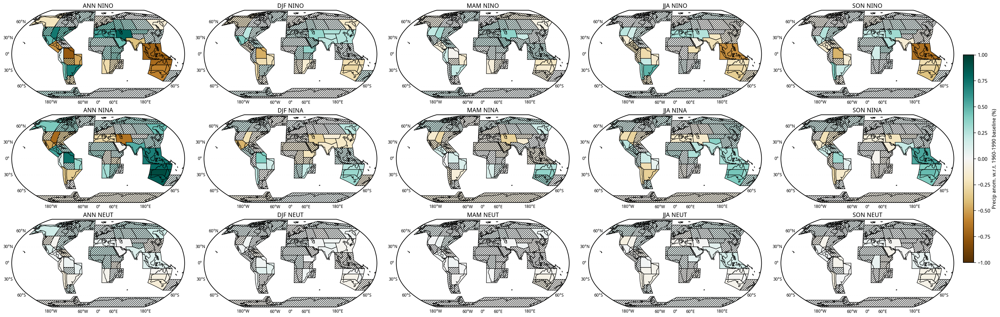

In [93]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1, vmax=1, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval_mme = pval_list, \
     nrows=3, ncols=5, figsize=(32,10), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'mme_enso_state.png', dpi=300, bbox_inches='tight')

#### nino change

In [94]:
plot_list = [mme_ds.isel(season = 0).enc, 
             mme_ds.isel(season = 1).enc,
             mme_ds.isel(season = 2).enc,
             mme_ds.isel(season = 3).enc,
             mme_ds.isel(season = 4).enc,
             mme_ds.isel(season = 0).lnc,
             mme_ds.isel(season = 1).lnc,
             mme_ds.isel(season = 2).lnc,
             mme_ds.isel(season = 3).lnc,
             mme_ds.isel(season = 4).lnc]

In [95]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [96]:
title_list = ['ANN ENC', 'DJF ENC', 'MAM ENC', 'JJA ENC', 'SON ENC',
              'ANN LNC', 'DJF LNC', 'MAM LNC', 'JJA LNC', 'SON LNC']

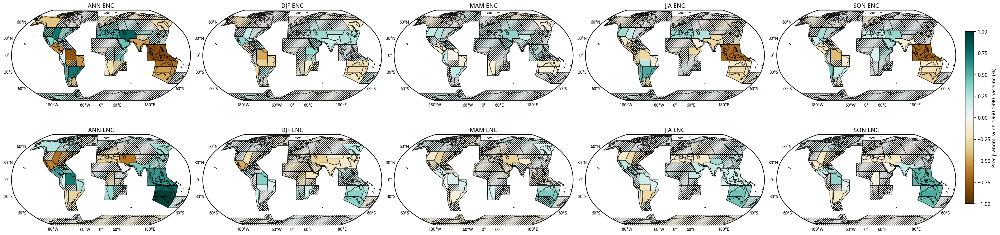

In [97]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1, vmax=1, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval_mme = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'mme_enso_change.png', dpi=300, bbox_inches='tight')

#### asymm and symm

In [98]:
plot_list = [mme_ds.isel(season = 0).asymm, 
             mme_ds.isel(season = 1).asymm,
             mme_ds.isel(season = 2).asymm,
             mme_ds.isel(season = 3).asymm,
             mme_ds.isel(season = 4).asymm,
             mme_ds.isel(season = 0).symm,
             mme_ds.isel(season = 1).symm,
             mme_ds.isel(season = 2).symm,
             mme_ds.isel(season = 3).symm,
             mme_ds.isel(season = 4).symm]

In [99]:
pval_list = [mme_ds.isel(season = 0).sign_ratio.to_numpy(), 
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 1).sign_ratio.to_numpy(),
             mme_ds.isel(season = 2).sign_ratio.to_numpy(),
             mme_ds.isel(season = 3).sign_ratio.to_numpy(),
             mme_ds.isel(season = 4).sign_ratio.to_numpy()]

In [100]:
title_list = ['ANN ASYMM', 'DJF ASYMM', 'MAM ASYMM', 'JJA ASYMM', 'SON ASYMM',
              'ANN SYMM', 'DJF SYMM', 'MAM SYMM', 'JJA SYMM', 'SON SYMM']

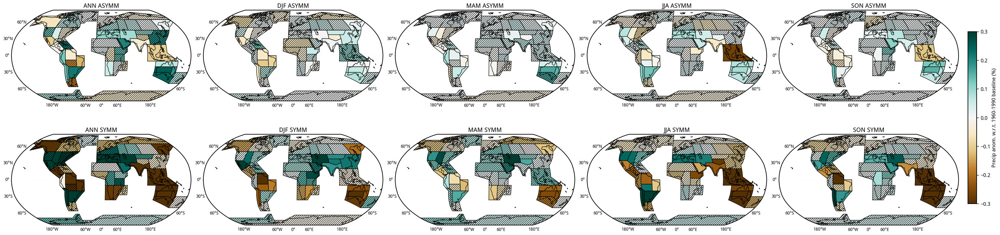

In [101]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-0.3, vmax=0.3, cbar_label = 'Precip anom. w.r.t. 1960-1990 baseline (%)', pval_mme = pval_list, \
     nrows=2, ncols=5, figsize=(32,8), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'mme_asymm_symm.png', dpi=300, bbox_inches='tight')

In [147]:
plot_list = [out.isel(season = 0, model=-2).nino, 
             out.isel(season = 0, model=-2).nina,
             out.isel(season = 0, model=-2).neut,
             mme_ds.isel(season = 0).nino,
             mme_ds.isel(season = 0).nina,
             mme_ds.isel(season = 0).neut]

In [148]:
pval_list = [out.isel(season = 0, model=-2).pval.to_numpy(), 
             out.isel(season = 0, model=-2).pval.to_numpy(),
             out.isel(season = 0, model=-2).pval.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy(),
             mme_ds.isel(season = 0).sign_ratio.to_numpy()]

In [149]:
title_list = ['OBS NINO', 'OBS NINA', 'OBS NEUT',
              'MME NINO', 'MME NINA', 'MME NEUT']

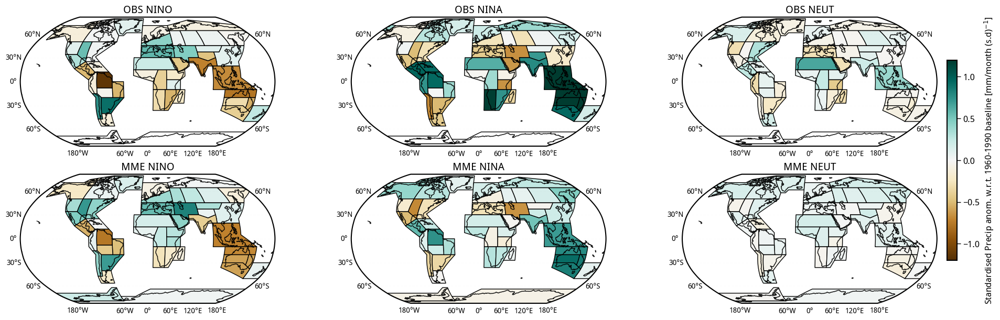

In [150]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-1.2, vmax=1.2, cbar_label = 'Standardised Precip anom. w.r.t. 1960-1990 baseline [mm/month (s.d)$^{-1}$]', pval_mme = [], \
     nrows=2, ncols=3, figsize=(20,6), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'mme_obs_ann_comparison_nino_state.png', dpi=300, bbox_inches='tight')

In [151]:
plot_list = [out.isel(season = 0, model=-2).asymm,
             mme_ds.isel(season = 0).asymm]

In [152]:
pval_list = [out.isel(season = 0, model=-2).pval.to_numpy(), 
             mme_ds.isel(season = 0).sign_ratio.to_numpy()]

In [153]:
title_list = ['OBS ASYMM',
              'MME ASYMM']

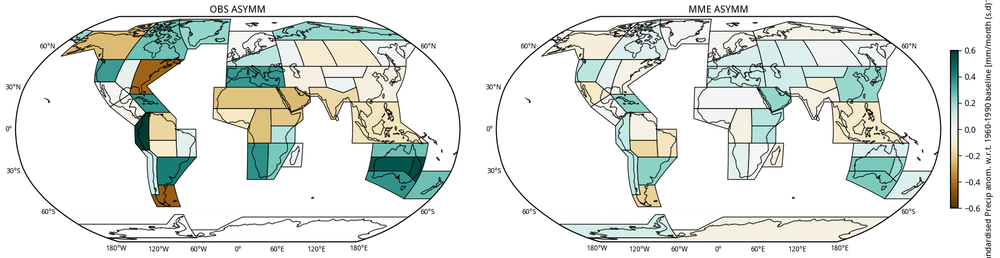

In [159]:
plot(plot_list, title_list, mpl.cm.BrBG, vmin=-0.6, vmax=0.6, cbar_label = 'Standardised Precip anom. w.r.t. 1960-1990 baseline [mm/month (s.d)$^{-1}$]', pval = [], \
     nrows=1, ncols=2, figsize=(20,5), ocean_mask_list = np.arange(0, 15, 1))
plt.savefig(save_loc+'mme_obs_ann_comparison_nino_state.png', dpi=300, bbox_inches='tight')

In [102]:
mme_df = mme_ds.to_dataframe()

In [103]:
obs_df = out.isel(model = -2).to_dataframe()

In [104]:
def fix_df(df):
    df['season'] = [i[1] for i in df.index]
    df['region'] = [i[0] for i in df.index]
    df.set_index(np.arange(0,230, 1), inplace=True)
    return df

In [105]:
mme_df = fix_df(mme_df)
obs_df = fix_df(obs_df)

In [106]:
mme_df['model'] = ['mme']*230

In [107]:
mme_df

,std_dev,clim,corr_coef,nino,nina,neut,en_events,ln_events,neut_events,threshold,enc,lnc,asymm,symm,sign_ratio,season,region,model
0,3.362703,33.590625,0.032968,0.143740,0.086066,0.118910,15.84375,18.25,45.90625,0.91129,0.024830,-0.032844,-0.004007,0.028837,0.09375,ANN,Greenland/Iceland,mme
1,9.024316,29.192433,0.051754,0.088680,-0.019964,0.073172,22.59375,18.25,45.90625,0.91129,0.015508,-0.093136,-0.038814,0.054322,0.21875,DJF,Greenland/Iceland,mme
2,8.095466,27.321030,0.079510,0.122999,-0.028864,0.046155,17.75000,18.25,45.90625,0.91129,0.076844,-0.075019,0.000913,0.075931,0.21875,MAM,Greenland/Iceland,mme
3,11.212956,38.772507,-0.003144,0.053115,0.129936,0.067072,11.96875,18.25,45.90625,0.91129,-0.013957,0.062864,0.024454,-0.038410,0.00000,JJA,Greenland/Iceland,mme
4,11.740312,39.079134,-0.032036,0.054056,0.109955,0.049852,17.18750,18.25,45.90625,0.91129,0.004204,0.060103,0.032153,-0.027949,0.15625,SON,Greenland/Iceland,mme
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,3.155333,36.590405,0.101654,0.200350,-0.067740,-0.017267,15.84375,18.25,45.90625,0.91129,0.217617,-0.050474,0.083572,0.134045,0.31250,ANN,W.Antarctica,mme
226,8.182358,28.071235,0.108293,0.092019,-0.069539,-0.027942,22.59375,18.25,45.90625,0.91129,0.119961,-0.041597,0.039182,0.080779,0.18750,DJF,W.Antarctica,mme
227,10.403738,43.536316,0.097465,0.113368,-0.084953,0.011897,17.75000,18.25,45.90625,0.91129,0.101472,-0.096850,0.002311,0.099161,0.18750,MAM,W.Antarctica,mme
228,10.006258,39.709418,0.041990,0.061609,-0.027192,0.000333,11.96875,18.25,45.90625,0.91129,0.061276,-0.027525,0.016875,0.044401,0.12500,JJA,W.Antarctica,mme


In [108]:
import pandas as pd

In [109]:
stack = pd.concat([obs_df, mme_df], axis=0)
stack

,std_dev,clim,corr_coef,pval,nino,nina,neut,en_events,ln_events,neut_events,threshold,model,enc,lnc,asymm,symm,season,region,sign_ratio
0,2.858186,27.660393,0.012448,0.894495,0.100013,0.159629,-0.075215,19.00000,16.00,43.00000,0.703152,obs,0.175228,0.234844,0.205036,-0.029808,ANN,Greenland/Iceland,NaN
1,7.059069,25.273886,-0.084066,0.369613,0.014035,0.175760,-0.130337,30.00000,16.00,43.00000,0.703152,obs,0.144372,0.306097,0.225234,-0.080862,DJF,Greenland/Iceland,NaN
2,5.895961,21.221461,0.043605,0.643566,0.064900,-0.079772,0.065105,18.00000,16.00,43.00000,0.703152,obs,-0.000205,-0.144877,-0.072541,0.072336,MAM,Greenland/Iceland,NaN
3,8.745159,29.654260,-0.076438,0.416825,-0.033314,0.270639,-0.034135,10.00000,16.00,43.00000,0.703152,obs,0.000821,0.304775,0.152798,-0.151977,JJA,Greenland/Iceland,NaN
4,8.283512,34.376005,0.144409,0.123613,0.160108,-0.099685,0.044000,17.00000,16.00,43.00000,0.703152,obs,0.116108,-0.143685,-0.013789,0.129897,SON,Greenland/Iceland,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,3.155333,36.590405,0.101654,NaN,0.200350,-0.067740,-0.017267,15.84375,18.25,45.90625,0.911290,mme,0.217617,-0.050474,0.083572,0.134045,ANN,W.Antarctica,0.31250
226,8.182358,28.071235,0.108293,NaN,0.092019,-0.069539,-0.027942,22.59375,18.25,45.90625,0.911290,mme,0.119961,-0.041597,0.039182,0.080779,DJF,W.Antarctica,0.18750
227,10.403738,43.536316,0.097465,NaN,0.113368,-0.084953,0.011897,17.75000,18.25,45.90625,0.911290,mme,0.101472,-0.096850,0.002311,0.099161,MAM,W.Antarctica,0.18750
228,10.006258,39.709418,0.041990,NaN,0.061609,-0.027192,0.000333,11.96875,18.25,45.90625,0.911290,mme,0.061276,-0.027525,0.016875,0.044401,JJA,W.Antarctica,0.12500


In [110]:
# stack['asymm'] = (stack['asymm']/stack['clim'])*100
# stack['enc'] = (stack['enc']/stack['clim'])*100
# stack['lnc'] = (stack['lnc']/stack['clim'])*100
# stack['nino'] = (stack['nino']/stack['clim'])*100
# stack['nina'] = (stack['nina']/stack['clim'])*100
# stack['neut'] = (stack['neut']/stack['clim'])*100

In [111]:
plt.rcParams['hatch.color'] = 'k'

In [112]:
def draw_hatch(ax, hatches):
    for hatch_pattern, these_bars in zip(hatches, ax.containers):
        for this_bar in these_bars:
            this_bar.set_hatch(3*hatch_pattern)

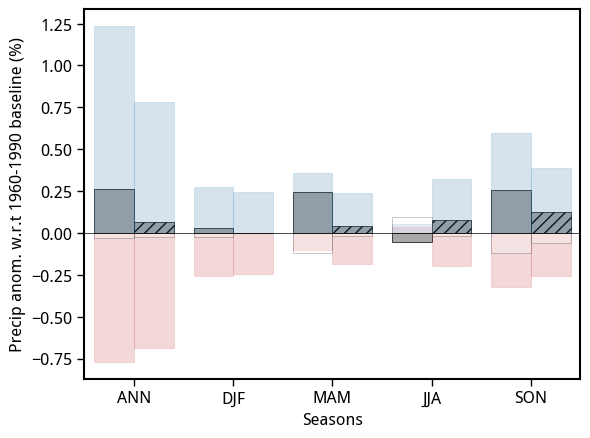

In [114]:
ax = sns.barplot(stack.loc[stack['region'] == 'N.Australia'], x = 'season', y='asymm', hue = 'model', \
                 palette=['darkgray', 'darkgray'], edgecolor='k', linewidth=0.5)
hatches = ['', '/']
draw_hatch(ax, hatches)
ax1 = sns.barplot(stack.loc[stack['region'] == 'N.Australia'], x = 'season', y='nino', hue = 'model', \
                 palette=['tab:red', 'tab:red'], alpha = 0.2, edgecolor='tab:red', linewidth=0.5)
draw_hatch(ax1, hatches)
ax2 = sns.barplot(stack.loc[stack['region'] == 'N.Australia'], x = 'season', y='nina', hue = 'model', \
                 palette=['tab:blue', 'tab:blue'], alpha = 0.2, edgecolor='tab:blue', linewidth=0.5)
draw_hatch(ax2, hatches)
ax3 = sns.barplot(stack.loc[stack['region'] == 'N.Australia'], x = 'season', y='neut', hue = 'model', \
                 palette=['white', 'white'], alpha = 0.3, edgecolor='k', linewidth=0.5)
draw_hatch(ax3, hatches)
            
        
        
# for hatch_pattern, these_bars in zip(hatches, ax2.containers):
#     for this_bar in these_bars:
#         this_bar.set_hatch(3 * hatch_pattern)
# plt.ylim(-10, 40)
plt.legend(labels = [],frameon=False, fontsize=10, loc = 'upper left')
plt.gca().set_xticklabels(['ANN', 'DJF', 'MAM', 'JJA', 'SON'])
plt.ylabel('Precip anom. w.r.t 1960-1990 baseline (%)')
plt.xlabel('Seasons')
plt.axhline(0, lw=0.5, color='k')
# plt.savefig(save_loc+'naus_mme_obs_diff.png', dpi=300, bbox_inches='tight')

In [100]:
import random
random.seed(42)
get_colors = lambda n: ["#%06x" % random.randint(0, 0xFFFFFF) for _ in range(n)]
# get_colors(46)

<Axes: xlabel='season', ylabel='sign_ratio'>

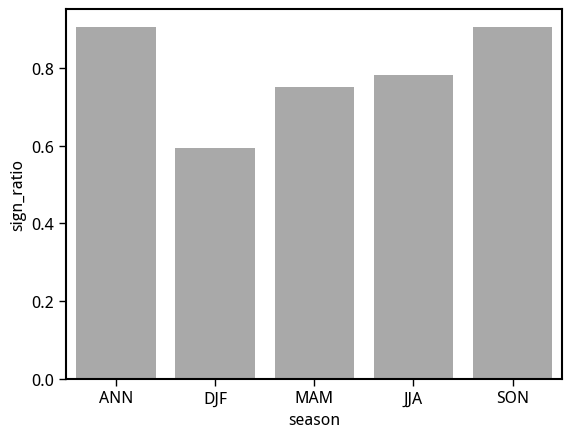

In [101]:
sns.barplot(mme_df.loc[mme_df['region'] == 'E.Australia'], x='season', y='sign_ratio', linewidth=0.5, color='darkgray')
# plt.ylim(0, 1.0)

In [122]:
na_df = out.isel(region = 39).to_dataframe()

In [124]:
na_df['season'] = [i[1] for i in na_df.index]
na_df['model'] = [i[0] for i in na_df.index]
na_df.set_index(np.arange(0,160, 1), inplace=True)

In [125]:
# na_df['asymm'] = (na_df['asymm']/na_df['clim'])*100
# na_df['enc'] = (na_df['enc']/na_df['clim'])*100
# na_df['lnc'] = (na_df['lnc']/na_df['clim'])*100
# na_df['nino'] = (na_df['nino']/na_df['clim'])*100
# na_df['nina'] = (na_df['nina']/na_df['clim'])*100
# na_df['neut'] = (na_df['neut']/na_df['clim'])*100

Text(0.5, 1.0, 'ANN')

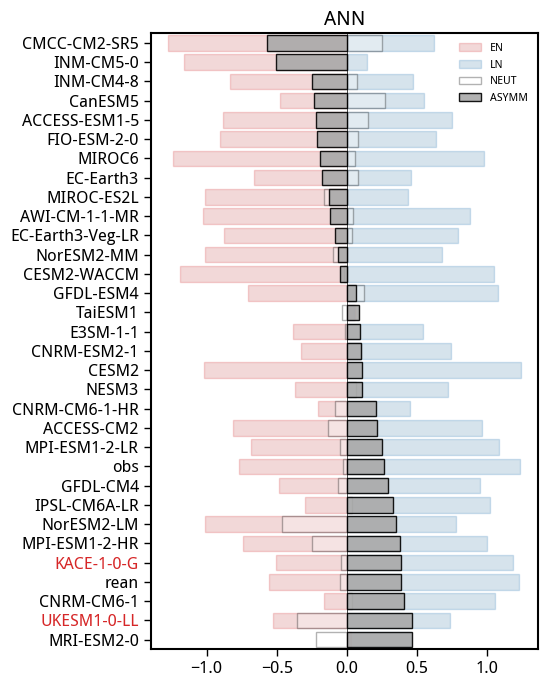

In [126]:
plt.figure(figsize=(5,8))


# plt.subplot(151)
sns.barplot(na_df.loc[ea_df['season'] == 'ANN'].sort_values('asymm'), x = 'nino', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.2, label='EN')
sns.barplot(na_df.loc[ea_df['season'] == 'ANN'].sort_values('asymm'), x = 'nina', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.2, label='LN')
sns.barplot(na_df.loc[ea_df['season'] == 'ANN'].sort_values('asymm'), x = 'neut', y='model', color='white', edgecolor='k', linewidth=1.0, alpha=0.3, label='NEUT')
sns.barplot(na_df.loc[ea_df['season'] == 'ANN'].sort_values('asymm'), x = 'asymm', y='model', color='darkgray', edgecolor='k', linewidth=1.0, alpha=0.9, label='ASYMM')
plt.axvline(0.0, linewidth=0.5, color='k')
plt.ylabel('')
plt.gca().get_yticklabels()[-2].set_color("tab:red")
plt.gca().get_yticklabels()[-5].set_color("tab:red")
plt.xlabel('')
plt.legend(frameon=False, fontsize=8)
plt.title('ANN')

# plt.subplot(152)
# sns.barplot(na_df.loc[na_df['season'] == 'djf'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'djf'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'djf'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('')
# # plt.legend(frameon=False, fontsize=8)
# plt.title('DJF')

# plt.subplot(153)
# sns.barplot(na_df.loc[na_df['season'] == 'mam'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'mam'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'mam'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('Precip. Anom w.r.t 1960-1990 baseline (%)')
# # plt.legend(frameon=False, fontsize=8)
# plt.title('MAM')

# plt.subplot(154)
# sns.barplot(na_df.loc[na_df['season'] == 'jja'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'jja'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'jja'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('')
# # plt.legend(frameon=False, fontsize=8)
# plt.title('JJA')

# plt.subplot(155)
# sns.barplot(na_df.loc[na_df['season'] == 'son'], x = 'enc', y='model', color='tab:red', edgecolor='tab:red', linewidth=1.0, alpha=0.1, label='ENC')
# sns.barplot(na_df.loc[na_df['season'] == 'son'], x = 'lnc', y='model', color='tab:blue', edgecolor='tab:blue', linewidth=1.0, alpha=0.1, label='LNC')
# sns.barplot(na_df.loc[na_df['season'] == 'son'], x = 'asymm', y='model', color='k', edgecolor='k', linewidth=1.0, label='ASYMM')
# plt.axvline(0.0, linewidth=0.5, color='k')
# plt.ylabel('')
# plt.yticks([])
# # plt.gca().get_yticklabels()[-4].set_color("tab:red")
# # plt.gca().get_yticklabels()[-6].set_color("tab:red")
# plt.xlabel('')
# plt.legend(frameon=False, fontsize=8, loc='lower right')
# plt.title('ANN')
# plt.savefig('./PhD/prelim_tasks/images/regional/naus_son_model_asymm.png', dpi=300, bbox_inches='tight')

In [92]:
data_df = mme_ds.isel(region = 41).to_dataframe()

In [93]:
# data_df['asymm'] = ((data_df['nino'] - data_df['neut']) + (data_df['nina'] - data_df['neut']))/2

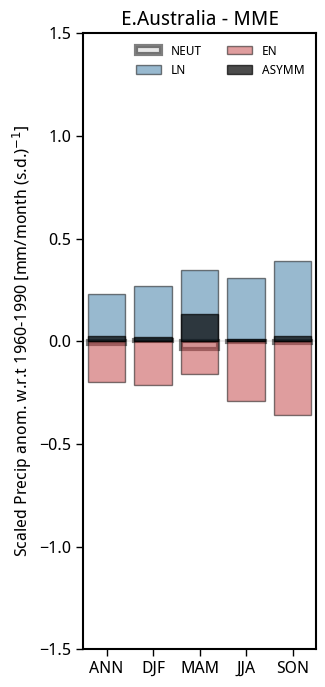

In [95]:
plt.figure(figsize=(3,8))
sns.barplot(data_df, y = 'neut', x = data_df.index, color='lightgray', linewidth=3.0, edgecolor='k', alpha=0.5, label = 'NEUT')
sns.barplot(data_df, y = 'nina', x = data_df.index, color='tab:blue', linewidth=1.0, edgecolor='k', alpha=0.5, label='LN')
sns.barplot(data_df, y = 'nino', x = data_df.index, color='tab:red', linewidth=1.0, edgecolor='k', alpha=0.5, label='EN')
sns.barplot(data_df, y = 'asymm', x = data_df.index, color='k', linewidth=1.0, edgecolor='k', alpha=0.7, label='ASYMM')
plt.ylim(-1.5, 1.5)
plt.axhline(0.0, lw=0.1, color='k')
plt.legend(frameon=False, fontsize=9, ncol=2)
plt.ylabel('Scaled Precip anom. w.r.t 1960-1990 [mm/month (s.d.)$^{-1}$]')
plt.xlabel('')
plt.title(data_df['region'][0] + ' - MME')
plt.savefig('./PhD/enso_precip_asymmetry/images/pres/eaus_mme_seasonal.png', dpi=300, bbox_inches='tight')